# Apply HDBSCAN, KMeans to get the cluster for Non-Null Attributes 
  - Module name: Cluster_Attribute_Distance_hdb_kmeans_091923.ipynb
    - Cloned from Cluster_Attribute_Distance_081423.ipynb written by Shiladitya and made the following modification 
  - input: Cluster_Non_Null_Attribs_081523.csv with shape = (7158, 4) and columns below
    - ClusterLabel        
    - Cluster Name        
    - Cluster Size        
    - Non-Null Attributes 
  
  - Functionality
    1. Get all attributes by tokenized items in 'Non-Null Attributes' and create a set 'all_attrbs'
      - apply "ast.literal_eval(x)" to convert 'Non-Null Attributes' to a list apply sum() to tokenize
      - apply set to dedupe
      - len(all_attrbs) = 221from input
    2. Inter cluster overlap
      - Define function cluster_attribute_overlap(clustid_1, clustid_2) to calculate inter cluster overlap  betwen two rows 
      - Create a DF 'clust_attrb_similarity' with column 'Similarity_Ref' 
      - For all rows, invoke cluster_attribute_overlap to calulate overlap between the row and row 10.
      - Apply  plotly and non- plotly to draw histogram for Similarity_Ref
    3. Define a function "get_attribute_dict(clust_attrbs) to build a dictionary
      - Scan items in all_attrbs and check if the item in clust_attrbs and  build a dictionary
        - Key: attribute from all_attrbs
        - value
        - 0 : if key is not in clust_attrbs
        - 1 : if key is in clust_attrbs
      - Invoke 'get_attribute_dict' with parameter as 'Non-Null Attributes' and build a dictionary
         - Based on the values from dictionary to create clust_attr['AttributeVector']
            - Key: attribute from all_attrbs
            - value 
                - 0 : if key is not in clust_attr['Non-Null Attributes']
                - 1 : if key is in clust_attr" ['Non-Null Attributes']
         - Based on the values from dictionary to create clust_attr['AttributeVector']
            - a list of  len = 221 with value 0 or 1
    4. Build models   
          - Create a list of attr_vects by  extracting values from clust_attr.AttributeVector
          - Apply HDBSCAN to fit attr_vects
            - Add a new column 'kmeans_cluster' into clust_attr to save 'means.labels_ 
            - Add a new column 'kmeans_clust_desc' into clust_attr by mapping kmeans_cluster to description specified in list(all_attrbs)
          - Apply KMeans to fit attr_vects 
            - Add a new column 'kmeans_cluster' into clust_attr to save 'means.labels_ 
            - Add a new column 'kmeans_clust_desc' into clust_attr by mapping kmeans_cluster to a description specified in list(all_attrbs)
    5. Plot for clustering
       - Apply TSNE to convert attr_vects into array X_embedded with two components.
       - For the columns 'hdb_cluster', 'hdb_clust_desc', 'kmeans_cluster', 'kmeans_clust_desc'] 
         - Apply sns.scatterplot   
         - Apply plotly scatter 
           - Construct df_tsne with columns below for plotly scatter 
             - 'x' 'y' 'hdb_cluster' 'hdb_clust_desc' 'kmeans_cluster'
                - 'x' is the first component of X_embedded
                - 'x' is the second component of X_embedded
    6. Save the CSV file 'hdb_kmeans_ClusteringResults_mmddyy.csv'
    
  - Author: Sophia Yue
  - Date: 09-19-23
  - Notes:  The scikit-learn  version  3.1 is required to run HDBCSAN 
    - Install most current version 1.3.0 for scikit-learn to run HDBCSAN
     - from Jupyter  
       - run 'sklearn.__version__' to get scikit-learn version 
       - run '!pip install --upgrade scikit-learn' to install scikit earn
     - from command       
       - run 'pip3 show scikit-learn' to get scikit-learn version 
       - run 'pip3 install --upgrade scikit-learn' to install scikit earn

In [1]:
#Inter cluster overlap
def cluster_attribute_overlap(clustid_1, clustid_2):
    att1 = set(clust_attr.iloc[[clustid_1]]['Non-Null Attributes'].apply(lambda x: ast.literal_eval(x)).sum())
    att2 = set(clust_attr.iloc[[clustid_2]]['Non-Null Attributes'].apply(lambda x: ast.literal_eval(x)).sum())
    overlap = att1.intersection(att2)
    return len(overlap)/(np.sqrt(len(att1))*np.sqrt(len(att2)))
    

In [1]:
import pandas as pd, numpy as np
import ast
from sklearn.cluster import HDBSCAN, KMeans
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option("display.max_rows", None)
pd.set_option("display.max_column", None)

In [2]:
path = 'C:\\users\\iny2819\\kroger\\Data\\' 
clust_attr = pd.read_csv(path + 'Cluster_Non_Null_Attribs_081523.csv') # (7158, 4)
clust_attr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7158 entries, 0 to 7157
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   ClusterLabel         7158 non-null   int64 
 1   Cluster Name         7158 non-null   object
 2   Cluster Size         7158 non-null   int64 
 3   Non-Null Attributes  7158 non-null   object
dtypes: int64(2), object(2)
memory usage: 223.8+ KB


In [4]:
clust_attr.head()

,ClusterLabel,Cluster Name,Cluster Size,Non-Null Attributes
0,0,"PARTY EVERYDAY,NOVELTY AND DECOR,GIFT-WRAP SEA...",1306,"['Color', 'Size Description', 'Other Size Desc..."
1,1,"ACCENT FURNITURE,KITCHEN/DINING,DECORATIVE ACC...",1145,"['Genre', 'Color', 'Size Description', 'Other ..."
2,2,"TEA BAGS & BULK TEA,TEA SWEETENED,TEA BAGS/HER...",1086,"['Method of Sweetening', 'Level of Sugar/Sucro..."
3,3,CARDS EVERYDAY,1085,"['VND_BRN_NAM', 'NET_CONT_EQV_UOM_VIP_TO_KRG_U..."
4,4,"COLD WEATHER ACS,BRANDED COLLECTIONS,JUNIOR SL...",991,"['Color', 'Size Description', 'Other Size Desc..."


In [5]:
clust_attr.tail()

,ClusterLabel,Cluster Name,Cluster Size,Non-Null Attributes
7153,7154,"MARIKA CURVES,MARIKA,4-16 BOTTOMS,SNACK MIX",10,"['MIN_DAYS_OF_SHF_LIF_AT_WHS_DAYS', 'NET_CONT_..."
7154,7155,"DVD'S,PUZZLES,GIFT-WRAP EVERYDAY,LAUNDRY",10,"['Genre', 'Color', 'Size Description', 'Consum..."
7155,7156,"NCAA OTHER,PHARMACY SUPPLIES,OTHER EVENTS,MARI...",10,"['Color', 'Size Description', 'Other Size Desc..."
7156,7157,"DIY ELECTRICAL,WORK LIGHTS,WATER BOTTLES",10,"['Color', 'LIV_NAT_ELG_FL', 'ALH_FL', 'IS_EDBL..."
7157,7158,"LAMPS,SHADES/BASES",10,"['VND_BRN_NAM', 'NET_CONT_EQV_UOM_VIP_TO_KRG_U..."


##  Get all attributes
  - apply "ast.literal_eval(x)" to convert 'Non-Null Attributes' to a list
  - apply sum() to tokennize  
    - sum() can't apply to list alone
    - sum() needs to come after lambda
  -  apply set to dedupe  
  - len(all_attrbs) = 221

In [6]:
#import ast
all_attrbs = set(clust_attr['Non-Null Attributes'].apply(lambda x: ast.literal_eval(x)).sum())  # type set
all_attrbs

{'1,3-Bis-(2,4-diaminophenoxy)propane',
 '1-Naphthol',
 '2 (4-tert-Butylbenzyl)',
 '2,5-Diaminotoluene',
 '2,6-Dimethoxy-3,5-pyridinediamine HCl',
 '2-Methyl-5-hydroxyethylaminophenol',
 '3-Aminophenol',
 '4-Amino-3-nitrophenol',
 '4-Hydroxy-propylamino-3-nitrophenol',
 'ALH_FL',
 'ASBD_ACU_PDT_HGT_IN_INCH',
 'ASBD_ACU_PDT_LTH_IN_INCH',
 'ASBD_ACU_PDT_WGT_IN_LBS',
 'ASBD_ACU_PDT_WTH_IN_INCH',
 'ASB_REQ_VLU',
 'ATI_TIP_KIT_ICD_VLU',
 'AVG_WTTG_VLU',
 'Age Restricted',
 'Alcohol Proof',
 'Almond and Almond Products',
 'Alpha-Isomethyl Ionone',
 'Amyl Cinnamal',
 'Amylcinnamyl Alcohol',
 'Anchovy and its Derivatives',
 'Anise Alcohol',
 'Apple and its derivatives',
 'Artist',
 'BPA_FRE_VLU',
 'BRD_ANM_TYP_VLU',
 'BTR_ICD_VLU',
 'BTR_REQ_VLU',
 'BTR_TYP_VLU',
 'Banner Name',
 'Barley and Barley Products',
 'Barnacle and its Derivatives',
 'Beef and its Derivatives',
 'Benzyl Alcohol',
 'Benzyl Benzoate',
 'Benzyl Cinnamate',
 'Benzyl Salicylate',
 'Boneless Claim',
 'Brazil Nut and Brazil 

In [7]:
cluster_attribute_overlap(1,0)

0.7437357441610946

In [8]:
ref_clust_ix = 10
clust_attrb_similarity = pd.DataFrame(columns= ['ClusterLabel','ClusterName','Similarity_Ref'])
for i in range(len(clust_attr)):
    row = clust_attr.iloc[i]
    #print(row['ClusterLabel'],row['Cluster Name'], cluster_attribute_overlap(7,i))
    clust_attrb_similarity.loc[len(clust_attrb_similarity)] = [row['ClusterLabel'],row['Cluster Name'],   \
                                                               cluster_attribute_overlap(ref_clust_ix,i)]
clust_attrb_similarity.sort_values('Similarity_Ref', ascending = False, inplace = True)  
clust_attrb_similarity[clust_attrb_similarity.Similarity_Ref >0.8].head(10)

,ClusterLabel,ClusterName,Similarity_Ref
10,10,"SANDWICH COOKIES,COOKIES: HOLIDAY/SPECIAL OCCA...",1.000000
7,7,"CAKES: CUPCAKES,CAKES: LAYERS,CAKES: SHEET,CAK...",0.909416
119,119,"POPCORN - MICROWAVE,BAGGED POPPED POPCORN,POPC...",0.878638
250,250,"INSTANT OATMEAL,STANDARD OATMEAL,CEREAL - HOT,...",0.859990
17,17,"BONNE BELL,NYX,PASSOVER PRODUCTS,MAYBELLINE",0.852679
13,13,"BBQ SAUCE,MAINSTREAM,PREMIUM,HOT SAUCE",0.848537
2,2,"TEA BAGS & BULK TEA,TEA SWEETENED,TEA BAGS/HER...",0.845315
155,155,"CANDY BAGS-CHOCOLATE,CANDY BAGS-NON CHOCOLATE,...",0.842378
31,31,"GREEK SS YOGURT,TRADITIONAL SS YOGURT,KIDS YOG...",0.841969
262,262,"PRETZELS,CANDY BAGS-CHOCOLATE W/FLOUR,SWEET GO...",0.841969


<Axes: >

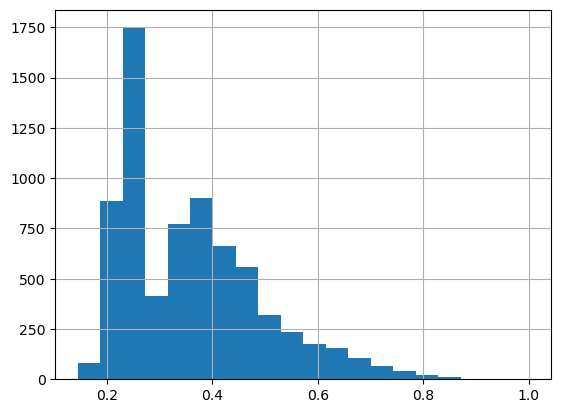

In [9]:
clust_attrb_similarity.Similarity_Ref.hist(bins = 20)

In [10]:
import plotly.express as px
fig = px.histogram(clust_attrb_similarity, x="Similarity_Ref", nbins=20)
fig.show()

In [11]:
import plotly.express as px
fig = px.histogram(clust_attrb_similarity, x="Similarity_Ref")
fig.show()

In [12]:
clust_attrb_similarity.tail()

,ClusterLabel,ClusterName,Similarity_Ref
3016,3016,ASSORTED GARDEN,0.176777
6826,6827,"PLANT STANDS & ACCESSORIES,DECOR PILLOWS",0.176777
5937,5938,SALLY HANSEN,0.144338
4721,4721,"SUNTAN FACIAL LOTION/STICK,SUNTAN LOTION,SUNTA...",0.144338
4993,4993,"MAYBELLINE,ALMAY,LOREAL COSMETICS",0.144338


## Attribute Binary Vectors
   - Build a dictionary 
     - Scan item in all_attrbs
     - Key: attribute from all_attrbs
     - value
       - 0 : if key  is not in Scan item/token clust_attr['Non-Null Attributes']
       - 1 : Scan item/token clust_attr['Non-Null Attributes']
   - Based on the values from dictionary to create clust_attr['AttributeVector']     
     - a list with len = 221

In [13]:
def get_attribute_dict(clust_attrbs):
    return {i: int(i in clust_attrbs) for i in all_attrbs}

In [14]:
get_attribute_dict(clust_attr['Non-Null Attributes'].iloc[200]) # len 221

{'Coumarin': 0,
 'Fee Printed on Card': 0,
 'Yam and its derivatives': 0,
 '2,5-Diaminotoluene': 0,
 'Hydroxycitronellal': 0,
 'Tree Nuts and Their Derivatives': 0,
 'Level of Sugar/Sucrose/Sweetener Claim': 0,
 'CORD_LTH_TX': 0,
 'Boneless Claim': 1,
 'Kamut': 0,
 'Value of Card (Fixed or Variable)': 0,
 '3-Aminophenol': 0,
 'Beef and its Derivatives': 0,
 'Rye and Their Derivatives': 0,
 'SYP_RLF_VLU': 0,
 'Does Not Contain Declaration Obligatory Allergens': 1,
 'ASB_REQ_VLU': 1,
 'Shipping Material': 0,
 'Product is Labeled with an FDA Approved National Drug Code (NDC)': 0,
 'p-Phenylenediamine': 0,
 'Other Floral Container Type': 0,
 'Soybean and its Derivatives': 0,
 'NON_STK_VLU': 0,
 'Lobster and its Derivatives': 0,
 'TPT_THS_IN_DGE_FEH': 0,
 'TYP_OF_LBL_VLU': 1,
 'Method of Sweetening': 0,
 'HAZ_FL': 0,
 'Treemoss Extract': 0,
 'Banner Name': 0,
 'Peas and Pea Products': 0,
 'Poppy Seeds and Their Derivatives': 0,
 'Type of Tobacco': 0,
 'Pork and its Derivatives': 0,
 'MIN_DA

In [15]:
clust_attr['AttributeVector'] = clust_attr['Non-Null Attributes'].apply(lambda x: list(get_attribute_dict(x).values()))

In [16]:
clust_attr.head()

,ClusterLabel,Cluster Name,Cluster Size,Non-Null Attributes,AttributeVector
0,0,"PARTY EVERYDAY,NOVELTY AND DECOR,GIFT-WRAP SEA...",1306,"['Color', 'Size Description', 'Other Size Desc...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
1,1,"ACCENT FURNITURE,KITCHEN/DINING,DECORATIVE ACC...",1145,"['Genre', 'Color', 'Size Description', 'Other ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,2,"TEA BAGS & BULK TEA,TEA SWEETENED,TEA BAGS/HER...",1086,"['Method of Sweetening', 'Level of Sugar/Sucro...","[0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, ..."
3,3,CARDS EVERYDAY,1085,"['VND_BRN_NAM', 'NET_CONT_EQV_UOM_VIP_TO_KRG_U...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,4,"COLD WEATHER ACS,BRANDED COLLECTIONS,JUNIOR SL...",991,"['Color', 'Size Description', 'Other Size Desc...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [17]:
#from sklearn.cluster import HDBSCAN, KMeans
attr_vects = [i for i in clust_attr.AttributeVector]

In [18]:
hdb = HDBSCAN(min_cluster_size= 5)
hdb.fit(attr_vects)
clust_attr['hdb_cluster'] = hdb.labels_ 
clust_attr['hdb_clust_desc'] = clust_attr['hdb_cluster'].apply( lambda x : 'Ignore' if x == -1 else list(all_attrbs)[x])
clust_attr.head(2)


,ClusterLabel,Cluster Name,Cluster Size,Non-Null Attributes,AttributeVector,hdb_cluster,hdb_clust_desc
0,0,"PARTY EVERYDAY,NOVELTY AND DECOR,GIFT-WRAP SEA...",1306,"['Color', 'Size Description', 'Other Size Desc...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",-1,Ignore
1,1,"ACCENT FURNITURE,KITCHEN/DINING,DECORATIVE ACC...",1145,"['Genre', 'Color', 'Size Description', 'Other ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",-1,Ignore


In [19]:
kmeans = KMeans(n_clusters= 50, random_state=0, n_init="auto").fit(attr_vects)
clust_attr['kmeans_cluster'] = kmeans.labels_ 
clust_attr['kmeans_clust_desc'] = clust_attr['kmeans_cluster'].apply( lambda x : 'Ignore' if x == -1 else list(all_attrbs)[x])
clust_attr.head() 

,ClusterLabel,Cluster Name,Cluster Size,Non-Null Attributes,AttributeVector,hdb_cluster,hdb_clust_desc,kmeans_cluster,kmeans_clust_desc
0,0,"PARTY EVERYDAY,NOVELTY AND DECOR,GIFT-WRAP SEA...",1306,"['Color', 'Size Description', 'Other Size Desc...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",-1,Ignore,35,Card Processor
1,1,"ACCENT FURNITURE,KITCHEN/DINING,DECORATIVE ACC...",1145,"['Genre', 'Color', 'Size Description', 'Other ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",-1,Ignore,25,TYP_OF_LBL_VLU
2,2,"TEA BAGS & BULK TEA,TEA SWEETENED,TEA BAGS/HER...",1086,"['Method of Sweetening', 'Level of Sugar/Sucro...","[0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, ...",-1,Ignore,16,ASB_REQ_VLU
3,3,CARDS EVERYDAY,1085,"['VND_BRN_NAM', 'NET_CONT_EQV_UOM_VIP_TO_KRG_U...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",113,Intended to be Used as a Topping or Ingredient,20,Other Floral Container Type
4,4,"COLD WEATHER ACS,BRANDED COLLECTIONS,JUNIOR SL...",991,"['Color', 'Size Description', 'Other Size Desc...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",-1,Ignore,7,CORD_LTH_TX


## TSNE
  - Convert (attr_vects) into 2 components
  - type(X_embedded ) : numpy.ndarray; len(X_embedded ) = 7158  
  - X_embedded[0:1]: array([[ 0.02376057, 22.084816  ]], dtype=float32)  

In [20]:
from sklearn.manifold import TSNE

X_embedded = TSNE(n_components=2, learning_rate='auto',init='random', random_state= 42).fit_transform(np.array(attr_vects))


## construct df_tsne for plotly scatter

In [21]:
df_tsne= pd.DataFrame(data = X_embedded, columns = ['x', 'y'])
df_tsne.head()

,x,y
0,0.023761,22.084816
1,9.290539,22.799671
2,49.554958,30.923683
3,-8.702268,-60.083042
4,20.194517,-0.452600


In [22]:
add_col  = ['hdb_cluster', 'hdb_clust_desc', 'kmeans_cluster', 'kmeans_clust_desc']
df_tsne [add_col] = clust_attr[add_col]
df_tsne.head()

,x,y,hdb_cluster,hdb_clust_desc,kmeans_cluster,kmeans_clust_desc
0,0.023761,22.084816,-1,Ignore,35,Card Processor
1,9.290539,22.799671,-1,Ignore,25,TYP_OF_LBL_VLU
2,49.554958,30.923683,-1,Ignore,16,ASB_REQ_VLU
3,-8.702268,-60.083042,113,Intended to be Used as a Topping or Ingredient,20,Other Floral Container Type
4,20.194517,-0.452600,-1,Ignore,7,CORD_LTH_TX


<Axes: title={'center': 'HDBSCAN: 2D projection of attribute-based superclusters'}>

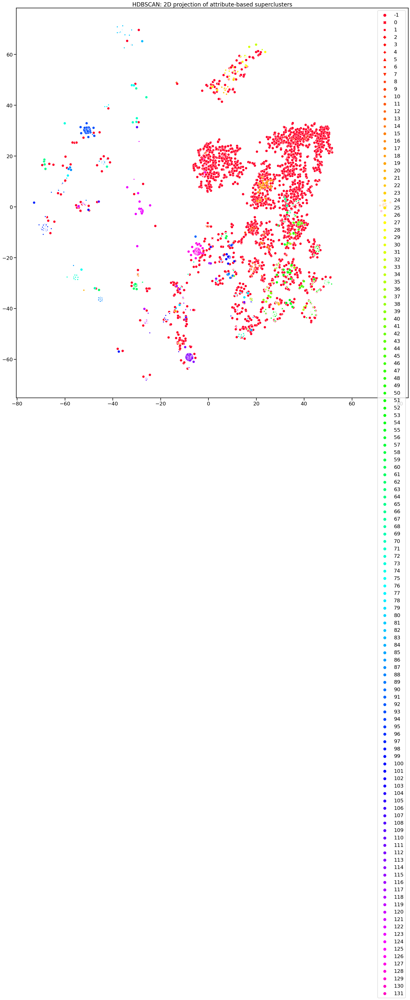

In [23]:
sns.set_context("talk", font_scale=1.1)
plt.figure(figsize=(25,25))
plt.title('HDBSCAN: 2D projection of attribute-based superclusters')
sns.scatterplot(x=X_embedded.T[0], 
                y=X_embedded.T[1], 
                hue=hdb.labels_,  style=hdb.labels_,palette = "gist_rainbow",legend= 'full')

<Axes: title={'center': 'HDBSCAN: 2D projection of attribute-based superclusters'}>

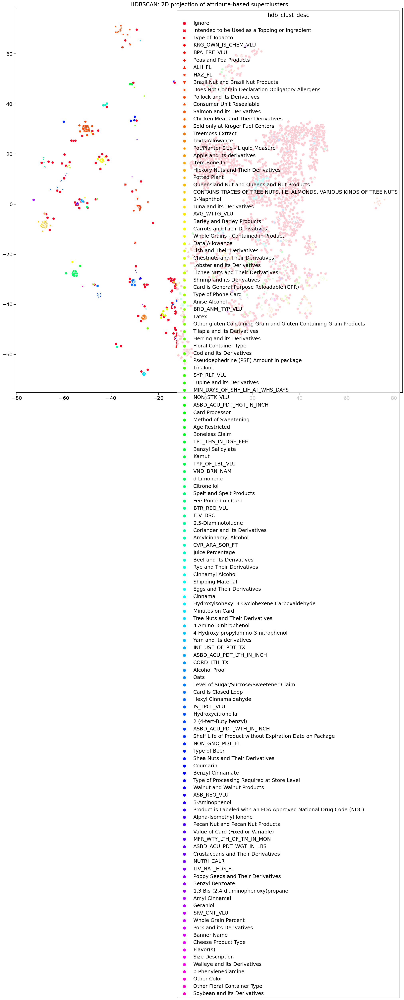

In [24]:
sns.set_context("talk", font_scale=1.1)
plt.figure(figsize=(25,25))
plt.title('HDBSCAN: 2D projection of attribute-based superclusters')
sns.scatterplot(x=X_embedded.T[0], 
                y=X_embedded.T[1], 
                hue=clust_attr['hdb_clust_desc'],   
                style=clust_attr['hdb_clust_desc'],palette = "gist_rainbow",legend= 'full')

In [25]:
fig = px.scatter(df_tsne, x='x', y='y', color="hdb_cluster")
fig.show()

In [26]:
fig = px.scatter(df_tsne, x='x', y='y', color= "hdb_clust_desc")
fig.show()

<Axes: title={'center': 'KMeans: 2D projection of at y=X_embedded.T[1],tribute-based superclusters'}>

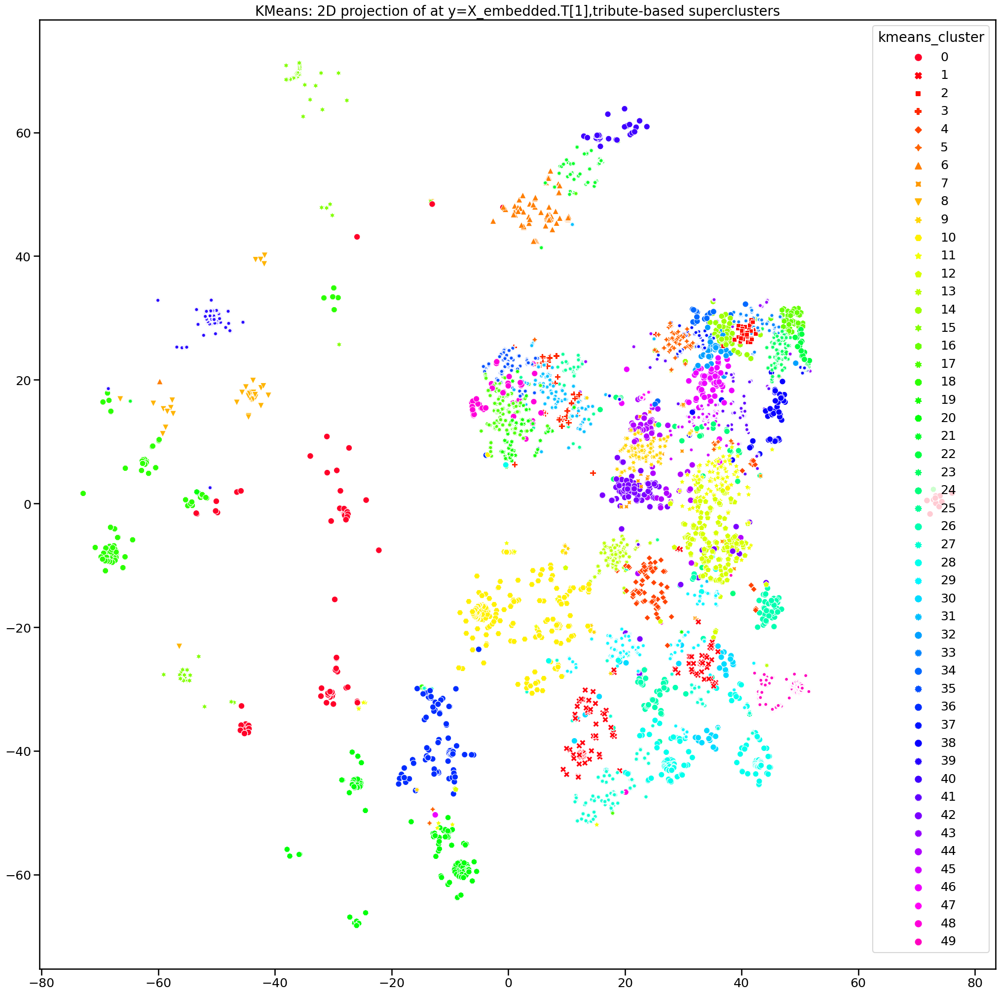

In [27]:
sns.set_context("talk", font_scale=1.1)
plt.figure(figsize=(25,25))
plt.title('KMeans: 2D projection of at y=X_embedded.T[1],tribute-based superclusters')
sns.scatterplot(x=X_embedded.T[0],
                y=X_embedded.T[1],
                hue=clust_attr['kmeans_cluster'],  
                style=clust_attr['kmeans_cluster'],palette = "gist_rainbow",legend= 'full')

<Axes: title={'center': 'KMeans: 2D projection of attribute-based superclusters'}>

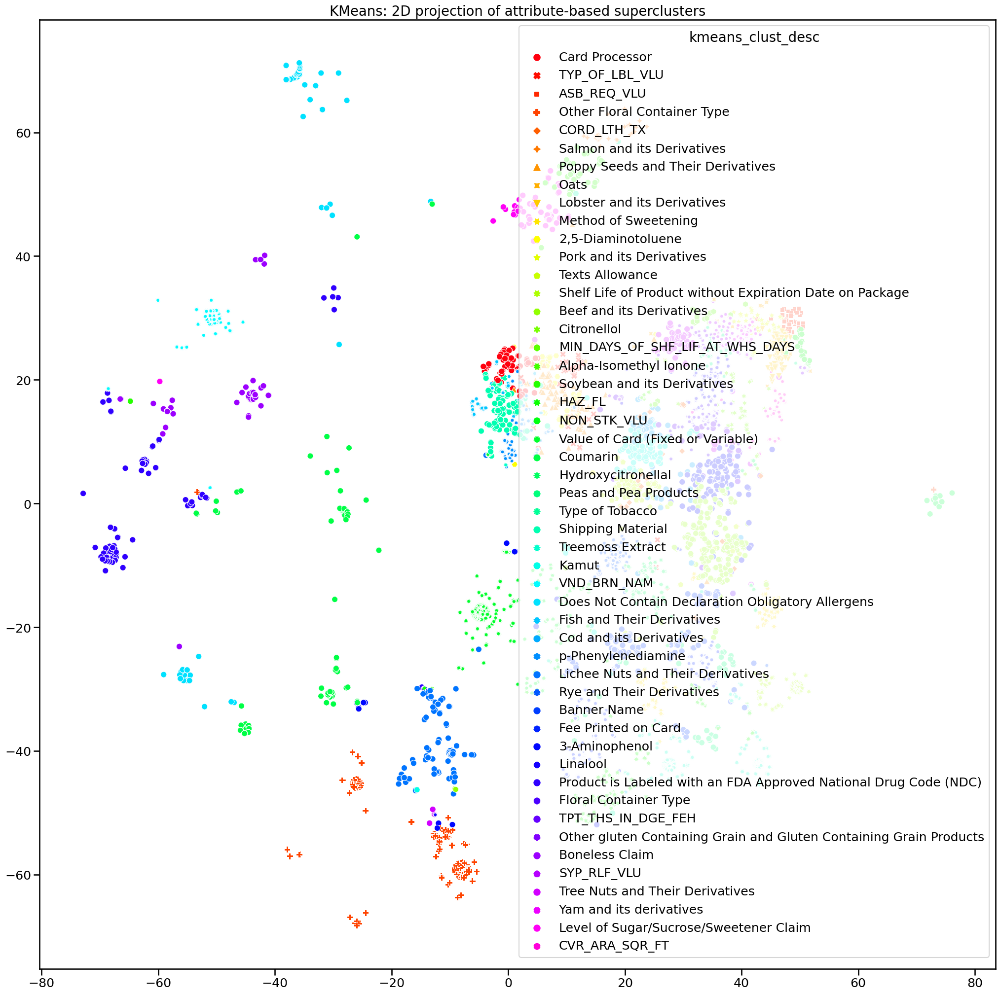

In [28]:
sns.set_context("talk", font_scale=1.1)
plt.figure(figsize=(25,25))
plt.title('KMeans: 2D projection of attribute-based superclusters')
sns.scatterplot(x=X_embedded.T[0], 
                y=X_embedded.T[1], 
                hue=clust_attr['kmeans_clust_desc'],  
                style=clust_attr['kmeans_clust_desc'],palette = "gist_rainbow",legend= 'full')

In [29]:
fig = px.scatter(df_tsne, x='x', y='y', color="kmeans_cluster")
fig.show()

In [30]:
fig = px.scatter(df_tsne, x='x', y='y', color= "kmeans_clust_desc")
fig.show()

In [31]:
from datetime import date
dte = date.today().strftime('%m%d%y')
f_name = f'{path}hdb_kmeans_ClusteringResults_{dte}.csv'
clust_attr.to_csv(f_name, index = None)

In [32]:
clust_attr['hdb_cluster'].value_counts(dropna = False).sort_index() 

-1      2784
 0         5
 1         8
 2         7
 3         6
 4         6
 5        32
 6         5
 7        15
 8         6
 9        18
 10        7
 11        6
 12       11
 13       16
 14       31
 15       68
 16       10
 17       61
 18       10
 19       11
 20        8
 21        6
 22       48
 23        8
 24       15
 25       20
 26       13
 27       11
 28       16
 29        6
 30       39
 31       10
 32       29
 33        8
 34       13
 35        7
 36        5
 37       13
 38       11
 39        5
 40        5
 41       12
 42        8
 43       25
 44        5
 45       12
 46        8
 47        5
 48       56
 49        6
 50        5
 51       45
 52       32
 53        7
 54       71
 55       14
 56       70
 57        6
 58       16
 59        5
 60       16
 61       46
 62        9
 63        6
 64        7
 65       32
 66       13
 67        8
 68        5
 69       13
 70       31
 71       26
 72       75
 73       17
 74       19
 75       25

In [33]:
clust_attr['kmeans_cluster'].value_counts(dropna = False).sort_index() 

0     1316
1      219
2       44
3       41
4      102
5       74
6      144
7       29
8      138
9      133
10     423
11     130
12     247
13      94
14      58
15     729
16      45
17     134
18     308
19      69
20     312
21      76
22      28
23      65
24      36
25      41
26     129
27     168
28     245
29     136
30      57
31     101
32      37
33      43
34      23
35      74
36     178
37      49
38      58
39     199
40     105
41      53
42      94
43      19
44      58
45      59
46      66
47       8
48      45
49     119
Name: kmeans_cluster, dtype: int64

In [4]:

    att1 = set(clust_attr.iloc[1]['Non-Null Attributes'])
    att2 = set(clust_attr.iloc[0]['Non-Null Attributes'])
    overlap = att1.intersection(att2)
    #return len(overlap)/(np.sqrt(len(att1))*np.sqrt(len(att2)))


In [7]:

    att1 = set(clust_attr.iloc[[1]]['Non-Null Attributes'].apply(lambda x: ast.literal_eval(x)).sum())
    att1

{'ALH_FL',
 'ASBD_ACU_PDT_HGT_IN_INCH',
 'ASBD_ACU_PDT_LTH_IN_INCH',
 'ASBD_ACU_PDT_WGT_IN_LBS',
 'ASBD_ACU_PDT_WTH_IN_INCH',
 'ASB_REQ_VLU',
 'CER_FOR_POV_DIET_FL',
 'CLX_DSC',
 'Color',
 'Does Not Contain Declaration Obligatory Allergens',
 'FIN_VLU',
 'Fish and Their Derivatives',
 'GLU_FRE_CLM_VLU',
 'Genre',
 'IS_EDBL_VLU',
 'IS_TPCL_VLU',
 'In Store Prepared/Packaged',
 'Intended to be Used as a Topping or Ingredient',
 'Is Item Intended for Human Consumption?',
 'LIV_NAT_ELG_FL',
 'MFR_WTY_LTH_OF_TM_IN_MON',
 'MIN_DAYS_OF_SHF_LIF_AT_WHS_DAYS',
 'MTL_VLU',
 'NET_CONT_EQV_UOM_VIP_TO_KRG_UOM',
 'NON_GMO_PDT_FL',
 'ORG_CLM_VLU',
 'Other Color',
 'Pot/Planter Size - Liquid Measure',
 'RDM_WGT_FL',
 'Rating',
 'SIZ_QY',
 'Size Description',
 'TPT_CLS_VLU',
 'TYP_OF_LBL_VLU',
 'VND_BRN_NAM'}